In [1]:
import keras
from keras.datasets import mnist
from keras.utils import np_utils
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import tensorflow as tf
import os
from urllib.parse import urlparse
from skimage.io import imread
from PIL import Image, ImageEnhance
from PIL import ImageFilter
from skimage.transform import resize
import image_utils as iu
from keras.datasets import mnist
from keras.models import Sequential
# from keras.layers import Dense, Dropout, Conv2D, MaxPool2D, Flatten, LSTM, BatchNormalization
from keras.layers import *
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50
from keras import Input, Model
from keras.preprocessing.image import ImageDataGenerator
from keras.models import load_model



In [2]:
data_path = 'data'
segmentation_path = os.path.join(data_path, 'segmentation')
#Contains satellite images from Google Earth and Planet taken with screenshots.
mining_path = os.path.join(segmentation_path, 'mining')
# training data paths
training_path = os.path.join(segmentation_path, 'training')
#train
train_path = os.path.join(training_path, 'train')
train_real_path = os.path.join(train_path, 'real')
train_mask_path = os.path.join(train_path, 'mask')
#val
val_path = os.path.join(training_path, 'val')
val_real_path = os.path.join(val_path, 'real')
val_mask_path = os.path.join(val_path, 'mask')
#test
test_path = os.path.join(training_path, 'test')
test_real_path = os.path.join(test_path, 'real')
test_mask_path = os.path.join(test_path, 'mask')
# Saved models
saved_model_path = os.path.join(segmentation_path, 'saved-models')
# Checkpoint path
checkpoint_path = os.path.join(segmentation_path, 'train_ckpt')
checkpoint_file_path = os.path.join(checkpoint_path, "segmentation.ckpt")
# Predictions path.
prediction_path = os.path.join(segmentation_path, 'predictions')
# Predicted image path.

In [95]:
#Converts the image into a numpy array and normalizes the pixel values.
def real_image_preprocessing_func(img):
    image = np.array(img)
    return image / 255

#Converts the mask into a numpy array and normalizes the pixel values.
#Values are also rounded to create a sharp image.
def mask_preprocessing_func(img):
    image = np.array(img) / 255
    return np.round(image)

In [97]:
seed = 909  # (IMPORTANT) to transform image and corresponding mask with same augmentation parameter.
# creates a data generator for training, validation and testing data.
x_train_datagen = ImageDataGenerator(
    preprocessing_function=real_image_preprocessing_func)
y_train_datagen = ImageDataGenerator(preprocessing_function=mask_preprocessing_func)
x_val_datagen = ImageDataGenerator(
    preprocessing_function=real_image_preprocessing_func)
y_val_datagen = ImageDataGenerator(preprocessing_function=mask_preprocessing_func)
x_test_datagen = ImageDataGenerator(
    preprocessing_function=real_image_preprocessing_func)
y_test_datagen = ImageDataGenerator(preprocessing_function=mask_preprocessing_func)
# load and iterate training dataset
image_width = 1024
image_height = 512
batch_size = 2
image_size = (image_height, image_width)
train_real = x_train_datagen.flow_from_directory(
    train_real_path, class_mode=None, batch_size=batch_size, target_size=image_size, color_mode='rgb', seed=seed)
train_mask = y_train_datagen.flow_from_directory(
    train_mask_path, class_mode=None, batch_size=batch_size, target_size=image_size, color_mode='grayscale', seed=seed)
# val
val_real = x_val_datagen.flow_from_directory(
    val_real_path, class_mode=None, batch_size=batch_size, target_size=image_size, color_mode='rgb', seed=seed)
val_mask = y_val_datagen.flow_from_directory(
    val_mask_path, class_mode=None, batch_size=batch_size, target_size=image_size, color_mode='grayscale', seed=seed)
# test
test_real = x_test_datagen.flow_from_directory(
    test_real_path, class_mode=None, batch_size=batch_size, target_size=image_size, color_mode='rgb', seed=seed)
test_mask = y_test_datagen.flow_from_directory(
    test_mask_path, class_mode=None, batch_size=batch_size, target_size=image_size, color_mode='grayscale', seed=seed)


Found 3120 images belonging to 1 classes.
Found 3120 images belonging to 1 classes.
Found 624 images belonging to 1 classes.
Found 624 images belonging to 1 classes.
Found 0 images belonging to 0 classes.
Found 416 images belonging to 1 classes.


In [5]:
#Creates a tuple of real and image mask to be passed to the model.
train_g = zip(train_real, train_mask)
val_g = zip(val_real, val_mask)
test_g = zip(test_real, test_mask)

Visualize Image.

In [39]:
x_batch, y_batch = next(train_g)

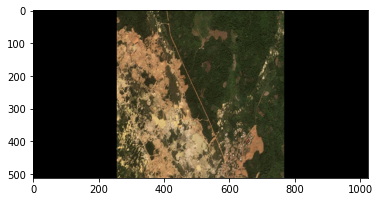

In [59]:
sample_index = 1
#A sample of the real image is displayed.
np_image = x_batch[sample_index].reshape(image_height, image_width, 3)
np_image = np.round(np.array(np_image * 255, dtype=np.uint8))
real_image = Image.fromarray(np_image)
iu.display_image(real_image)


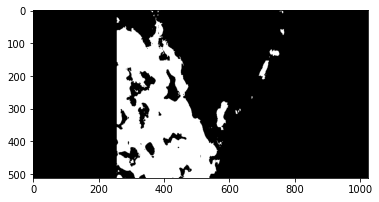

In [60]:
#A sample of the mask image is displayed.
np_mask = y_batch[sample_index].reshape(image_height, image_width)
np_mask = np.round(np.array(np_mask * 255, dtype=np.uint8))
mask_image = Image.fromarray(np_mask)
iu.display_image(mask_image, 'gray')


In [44]:
def split_image(image, row_count, col_count):
    parts = []
    width, height = image.size
    left = 0
    top = 0
    right = width / col_count
    bottom = height / row_count
    for r in range(row_count):
        top = int(r * (height / row_count))
        bottom = int(top + (height / row_count))
        for c in range(col_count):
            left = int(c * (width / col_count))
            right = int(left + (width / col_count))
            part = image.crop((left, top, right, bottom))
            parts.append(part)
    return parts

In [16]:
# A folder for saving checkpoint is created for
iu.create_dir_if_not_exists(checkpoint_path)
# Create a callback that saves the model's weights every epoch
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_file_path,
    verbose=0,
    save_weights_only=True,
    save_freq='epoch')

In [8]:
# define loss functions.
def iou(y_true, y_pred):
    def f(y_true, y_pred):
        intersection = (y_true * y_pred).sum()
        union = y_true.sum() + y_pred.sum() - intersection
        x = (intersection + 1e-15) / (union + 1e-15)
        x = x.astype(np.float32)
        return x

    return tf.numpy_function(f, [y_true, y_pred], tf.float32)


smooth = 1e-15


def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred))


def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred))


def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)


## Define Loss Function and Metrics
In image segmentation **dice loss** is usually used as a loss function while **dice coefficient** and iou are used as metrics.<br>
Unfortunately the dice loss function is unable update the loss when the model is trained with an image with a black/background<br>
only mask so the **dice loss** and **iou** function are modified slightly to help the model train with a black/background mask.

In [9]:
smooth = 1e-15
# define loss functions.
def global_iou(y_true, y_pred):
    def f(y_true, y_pred):
        if tf.math.less(tf.reduce_max(y_true), tf.constant([0.5])):
            y_true = 1 - y_true
            y_pred = 1 - y_pred
        intersection = (y_true * y_pred).sum()
        union = y_true.sum() + y_pred.sum() - intersection
        x = (intersection + 1e-15) / (union + 1e-15)
        x = x.astype(np.float32)
        return x
    return tf.numpy_function(f, [y_true, y_pred], tf.float32)

def dice_global_coef(y_true, y_pred):
    if tf.math.less(tf.reduce_max(y_true), tf.constant([0.5])):
        y_true = 1 - y_true
        y_pred = 1 - y_pred
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred))


def dice_global_loss(y_true, y_pred):
    return 1.0 - dice_global_coef(y_true, y_pred)


## Modelling
Image segmentation is achieved with the U-net architecture.<br>
To improve the training performance transfer learning techniques are used.<br>
The encoder block of the U-Net model is made up of layers of a pre-trained<br>
VGG16 model with weights updated using *imagenet*.

In [10]:
from tensorflow.keras.initializers import RandomNormal

# Define conv block.
def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(num_filters, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

# Define Decoder block
def define_decoder(inputs, skip_layer, num_filters):
    init = RandomNormal(stddev=0.02)
    x = Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding='same', kernel_initializer=init)(inputs)
    g = Concatenate()([x, skip_layer])
    g = conv_block(g, num_filters)
    return g

In [61]:
# Creates a VGG16 Unet model
def vgg16_unet(input_shape):
    inputs = Input(shape=input_shape)
    vgg16 = VGG16(include_top=False, weights='imagenet',
                  input_tensor=inputs)  # We will extract encoder layers based on their output shape from vgg16 model
    s1 = vgg16.get_layer('block1_conv2').output
    s2 = vgg16.get_layer('block2_conv2').output
    s3 = vgg16.get_layer('block3_conv3').output
    s4 = vgg16.get_layer('block4_conv3').output  # bottleneck/bridege layer from vgg16
    b1 = vgg16.get_layer('block5_conv3').output  #32
    # Decoder Block
    d1 = define_decoder(b1, s4, 512)
    d2 = define_decoder(d1, s3, 256)
    d3 = define_decoder(d2, s2, 128)
    d4 = define_decoder(d3, s1, 64)  #output layer
    outputs = Conv2D(1, 1, padding='same', activation='sigmoid')(d4)
    model = Model(inputs, outputs)
    return model

In [26]:
#Build vgg unet model 1
input_size = (image_height, image_width, 3)
lr = 1e-4
model = vgg16_unet(input_size)
model.compile(loss=dice_global_loss, optimizer=tf.keras.optimizers.Adam(lr), metrics=[
    dice_global_coef, global_iou])
model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 512, 1024,   0           []                               
                                3)]                                                               
                                                                                                  
 block1_conv1 (Conv2D)          (None, 512, 1024, 6  1792        ['input_2[0][0]']                
                                4)                                                                
                                                                                                  
 block1_conv2 (Conv2D)          (None, 512, 1024, 6  36928       ['block1_conv1[0][0]']           
                                4)                                                          

In [ ]:
#Load previously checkpoint or weights if any to resume training.
model.load_weights(checkpoint_file_path)

In [102]:
history = model.fit_generator(
    train_g,
    steps_per_epoch=train_real.samples / batch_size,
    epochs=10,
    validation_data=val_g,
    validation_steps=val_real.samples / batch_size,
    verbose=1, callbacks=[cp_callback])

/ Users/ernestopoku-kwarteng/virtualenvs/django3/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py: 1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators. 
warnings.warn('`Model.fit_generator` is deprecated and'

Epoch 1/1
2142/2142 55590s 26s/step - loss: 0.1223 - dice_global_coef: 0.8777 - global_iou: 0.8034 - val_loss: 0.1330 - val_dice_global_coef: 0.8670 - val_global_iou: 0.8030

Epoch 1: saving model to data/train-data/train_ckpt/cp.ckpt


In [38]:
#Model is saved as h5 format after training.
iu.create_dir_if_not_exists(saved_model_path)
from datetime import datetime
model.save(os.path.join(saved_model_path,'unet_model_' + str(datetime.now()).replace(':', '-') + '.h5'))

## Predictions

In [81]:
from datetime import datetime

# Creates a mask a transparent background
def create_transparent_mask(mask, color, opacity):
    r, g, b = color
    mask = mask.convert('RGBA')
    np_mask = np.asarray(mask) / 255
    #set opacity.
    np_mask[:, :, 3] = np_mask[:, :, 0] * opacity
    #set channel values.
    np_mask[:, :, 0] *= r / 255
    np_mask[:, :, 1] *= g / 255
    np_mask[:, :, 2] *= b / 255
    np_mask *= 255
    return Image.fromarray(np.array(np_mask, dtype=np.uint8)).convert('RGBA')


def create_background_mask(mask, color, opacity):
    r, g, b = color
    # pixel values are flipped.
    mask = mask.convert('RGBA')
    np_mask = np.asarray(mask) / 255
    np_mask = 1 - np_mask
    #set opacity.
    np_mask[:, :, 3] = np_mask[:, :, 0] * opacity
    #set channel values.
    np_mask[:, :, 0] *= r / 255
    np_mask[:, :, 1] *= g / 255
    np_mask[:, :, 2] *= b / 255
    np_mask *= 255
    return Image.fromarray(np.array(np_mask, dtype=np.uint8)).convert('RGBA')

# Super imposes the predicted mask on top of the real image
# for visualization purposes.
def create_masked_image(image, mask, color, opacity):
    t_mask = create_transparent_mask(mask, color, opacity).resize(image.size)
    image = image.convert('RGBA')
    image.paste(t_mask, (0, 0), t_mask)
    return image

def create_masked_background(image, mask, color, opacity):
    t_mask = create_background_mask(mask, color, opacity).resize(image.size)
    image = image.convert('RGBA')
    image.paste(t_mask, (0, 0), t_mask)
    return image

# Predicts the mask of an image.
def predict_mask(unet, image, input_size):
    # split image
    image_width, image_height = input_size
    image = image.resize(input_size)
    np_img = np.asarray(image) / 255
    pred = unet.predict(np.array([np_img]))
    # print(pred[0].max())
    mask = np.round(pred[0])
    # print(mask)
    mask = mask * 255
    mask = Image.fromarray(mask.reshape(
        image_height, image_width)).convert("L")
    return mask


# def show_mask_predictions(unet, path):
#     real_image = iu.read_image(
#         path, 'RGB')
#     mask = predict_mask(unet, real_image)
#     iu.display_image(mask, 'gray')
#     #save image
#     iu.create_dir_if_not_exists(prediction_path)
#     mask.save(os.path.join(prediction_path, str(
#         datetime.now()).replace(':', '-') + '.jpg'))

# Predicts an image where the mask is used to highlight the predicted area
# Using the specified color.
def predict_masked_image(unet, real_image, input_size,opacity):
    mask = predict_mask(unet, real_image, input_size)
    mi = create_masked_image(real_image, mask, (0, 0, 255), opacity)
    return mi

# Predicts an image where the mask is used to highlight the predicted area
# and the background is faded.
def highlight_predicted_area(unet, real_image):
    # real_image = iu.read_image(
    #     path, 'RGB')
    mask = predict_mask(unet, real_image, (image_width, image_height))
    mi = create_masked_background(real_image, mask, (0, 0, 0), 0.8)
    return mi


Real Image


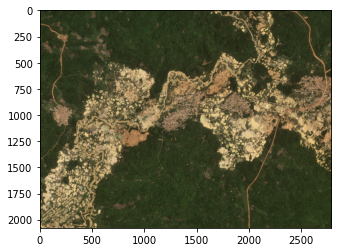

In [93]:
x_batch, y_batch = next(test_g)
#A sample of the real image is displayed.
np_image = x_batch[sample_index].reshape(image_height, image_width, 3)
np_image = np.round(np.array(np_image * 255, dtype=np.uint8))
real_im = Image.fromarray(np_image)
print('Real Image')
iu.display_image(real_im)

Ground Truth


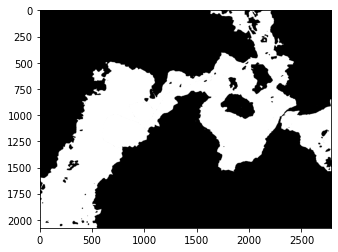

In [88]:
np_mask = y_batch[sample_index].reshape(image_height, image_width, 1)
np_mask = np.round(np.array(np_mask * 255, dtype=np.uint8))
real_mask = Image.fromarray(np_mask)
print('Ground Truth')
iu.display_image(real_mask, 'gray')


Predicted Mask


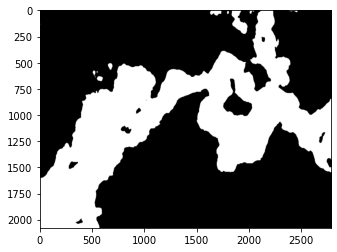

In [89]:
mask = predict_mask(model, real_im, (image_width, image_height)).resize(real_im.size)
print('Predicted Mask')
iu.display_image(mask, 'gray')

Blue mask superimposed on mining areas


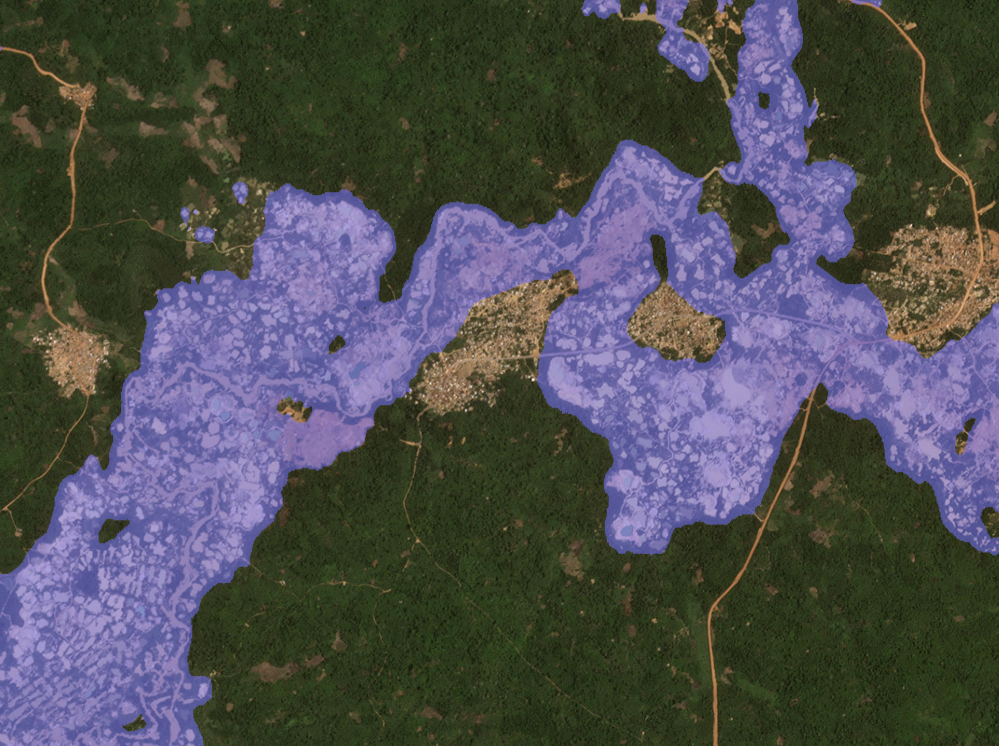

In [91]:
masked_im = predict_masked_image(model, real_im, (image_width, image_height), 0.4)
print('Blue mask superimposed on mining areas')
masked_im

Highlighted mining sites


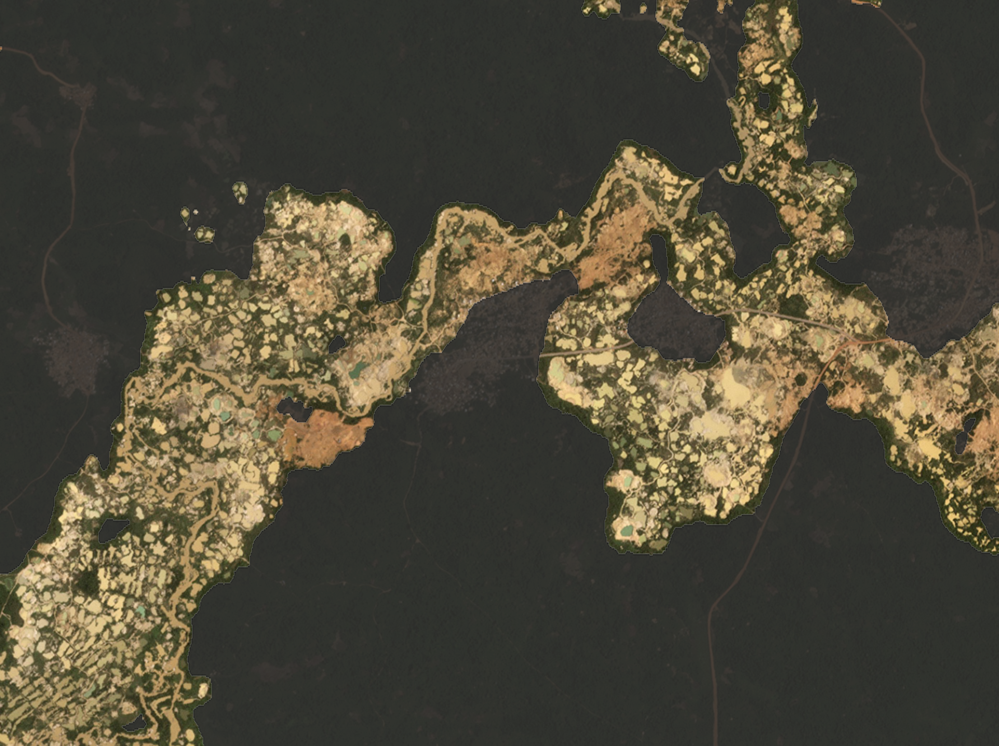

In [92]:
print('Highlighted mining sites')
highlight_predicted_area(
    model, real_im)

In [ ]:
#Test images are predicted and saved to the predictions directory.
image_paths = iu.get_all_files(os.path.join(test_real_path, 'images'), False)
iu.create_dir_if_not_exists(prediction_path)
for path in image_paths:
    im = predict_masked_image(model, os.path.join(
        test_real_path, 'images', path), 0.3)
    im.save(os.path.join(prediction_path, path + '.png'))